In [1108]:
import pandas as pd

In [1109]:
df = pd.read_csv('ecommerce.csv')

1.a) Оценка качества данных, их актуальность и достаточность для решения поставленной задачи.

In [1111]:
df.head()

,CID,TID,Gender,Age Group,Purchase Date,Product Category,Discount Availed,Discount Name,Discount Amount (INR),Gross Amount,Net Amount,Purchase Method,Location
0,943146,5876328741,Female,25-45,30/08/2023 20:27:08,Electronics,Yes,FESTIVE50,64.30,725.304000,661.004000,Credit Card,Ahmedabad
1,180079,1018503182,Male,25-45,23/02/2024 09:33:46,Electronics,Yes,SEASONALOFFER21,175.19,4638.991875,4463.801875,Credit Card,Bangalore
2,337580,3814082218,Other,60 and above,06/03/2022 09:09:50,Clothing,Yes,SEASONALOFFER21,211.54,1986.372575,1774.832575,Credit Card,Delhi
3,180333,1395204173,Other,60 and above,04/11/2020 04:41:57,Sports & Fitness,No,NaN,0.00,5695.612650,5695.612650,Debit Card,Delhi
4,447553,8009390577,Male,18-25,31/05/2022 17:00:32,Sports & Fitness,Yes,WELCOME5,439.92,2292.651500,1852.731500,Credit Card,Delhi


о датасете:
0. CID (Customer ID): A unique identifier for each customer.
1. TID (Transaction ID): A unique identifier for each transaction.
2. Gender: The gender of the customer, categorized as Male or Female.
3. Age Group: Age group of the customer, divided into several ranges.
4. Purchase Date: The timestamp of when the transaction took place.
5. Product Category: The category of the product purchased, such as Electronics, Apparel, etc.
6. Discount Availed: Indicates whether the customer availed any discount (Yes/No).
7. Discount Name: Name of the discount applied (e.g., FESTIVE50).
8. Discount Amount (INR): The amount of discount availed by the customer.
9. Gross Amount: The total amount before applying any discount.
10. Net Amount: The final amount after applying the discount.
11. Purchase Method: The payment method used (e.g., Credit Card, Debit Card, etc.).
12. Location: The city where the purchase took place.

In [1113]:
df.shape

(55000, 13)

In [1114]:
df['Location'].value_counts()

Location
Mumbai       11197
Delhi        10799
Bangalore     8249
Hyderabad     5545
Chennai       4368
Pune          3781
Ahmedabad     2785
Kolkata       2709
Jaipur        1678
Lucknow       1136
Other         1046
Varanasi       606
Dehradun       553
Srinagar       548
Name: count, dtype: int64

Так как количество уникальных значений в столбце Location не превосходит 15, то можно будет использовать dummy переменные.

Количество строк в каждом столбце > 1000 строк, что является достаточным обучения модели

In [1117]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55000 entries, 0 to 54999
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   CID                    55000 non-null  int64  
 1   TID                    55000 non-null  int64  
 2   Gender                 55000 non-null  object 
 3   Age Group              55000 non-null  object 
 4   Purchase Date          55000 non-null  object 
 5   Product Category       55000 non-null  object 
 6   Discount Availed       55000 non-null  object 
 7   Discount Name          27415 non-null  object 
 8   Discount Amount (INR)  55000 non-null  float64
 9   Gross Amount           55000 non-null  float64
 10  Net Amount             55000 non-null  float64
 11  Purchase Method        55000 non-null  object 
 12  Location               55000 non-null  object 
dtypes: float64(3), int64(2), object(8)
memory usage: 5.5+ MB


In [1118]:
for column in df.columns:
    print(f'{"-"*30}{column}{"-"*30}')
    print(f'Number of unique values: {df[column].nunique()}')
    print(f'The unique values: {df[column].unique()}')

------------------------------CID------------------------------
Number of unique values: 29071
The unique values: [943146 180079 337580 ... 306954 649543 649435]
------------------------------TID------------------------------
Number of unique values: 55000
The unique values: [5876328741 1018503182 3814082218 ... 9587323189 5032564481 9172953722]
------------------------------Gender------------------------------
Number of unique values: 3
The unique values: ['Female' 'Male' 'Other']
------------------------------Age Group------------------------------
Number of unique values: 5
The unique values: ['25-45' '60 and above' '18-25' '45-60' 'under 18']
------------------------------Purchase Date------------------------------
Number of unique values: 54988
The unique values: ['30/08/2023 20:27:08' '23/02/2024 09:33:46' '06/03/2022 09:09:50' ...
 '02/08/2024 09:30:44' '05/08/2020 23:57:56' '21/07/2022 09:05:18']
------------------------------Product Category------------------------------
Numbe

типы данных: CID, TID - целое число (64 бита); Gender, Age Group, Purchase Date, Product Category, Discount Availed, Discount Name, Purchase Method, Location - объект; Discount Amount (INR), Gross Amount, Net Amount - вещественное число (64 бита).

In [1120]:
df.isnull().sum()

CID                          0
TID                          0
Gender                       0
Age Group                    0
Purchase Date                0
Product Category             0
Discount Availed             0
Discount Name            27585
Discount Amount (INR)        0
Gross Amount                 0
Net Amount                   0
Purchase Method              0
Location                     0
dtype: int64

Удаляем переменную Discount Name по следующим причинам:
1. Количество пропущенных ячеек в Discount Name составляет 27585 строк, что составляет около 50%;
2. Несущественность Discount Name. Удаление названия скидки не окажет существенного влияние на объясняемую перменную, ибо существует такая объясняющая переменная, как размер скидки (Discount Amount (INR)).

In [1122]:
missed_percent = 27585/55000
print(missed_percent)

0.5015454545454545


In [1123]:
df = df.drop(['Discount Name'], axis=1)

Удаляем переменные CID, TID, так как они не играют существенного значения в построении модели регрессии.

In [1125]:
df = df.drop(['CID', 'TID'], axis=1)

Преобразование Purchase Date со строками даты/времени, в представление datetime библиотеки pandas

In [1127]:
df['Purchase Date'] = pd.to_datetime(df['Purchase Date'],format = '%d/%m/%Y %H:%M:%S')

In [1128]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55000 entries, 0 to 54999
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Gender                 55000 non-null  object        
 1   Age Group              55000 non-null  object        
 2   Purchase Date          55000 non-null  datetime64[ns]
 3   Product Category       55000 non-null  object        
 4   Discount Availed       55000 non-null  object        
 5   Discount Amount (INR)  55000 non-null  float64       
 6   Gross Amount           55000 non-null  float64       
 7   Net Amount             55000 non-null  float64       
 8   Purchase Method        55000 non-null  object        
 9   Location               55000 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(6)
memory usage: 4.2+ MB


In [1129]:
df.duplicated().sum()

0

Количество дублей в данных равно 0.

In [1131]:
!pip install numpy

In [1132]:
df.describe(include = 'all')

,Gender,Age Group,Purchase Date,Product Category,Discount Availed,Discount Amount (INR),Gross Amount,Net Amount,Purchase Method,Location
count,55000,55000,55000,55000,55000,55000.000000,55000.000000,55000.000000,55000,55000
unique,3,5,NaN,9,2,NaN,NaN,NaN,8,14
top,Female,25-45,NaN,Electronics,No,NaN,NaN,NaN,Credit Card,Mumbai
freq,18454,22010,NaN,16574,27585,NaN,NaN,NaN,22096,11197
mean,NaN,NaN,2022-03-19 14:27:22.813054464,NaN,NaN,136.986796,3012.936606,2875.949810,NaN,NaN
min,NaN,NaN,2019-09-19 11:46:07,NaN,NaN,0.000000,136.454325,-351.119775,NaN,NaN
25%,NaN,NaN,2020-12-17 14:39:50,NaN,NaN,0.000000,1562.111325,1429.551863,NaN,NaN
50%,NaN,NaN,2022-03-17 06:27:07,NaN,NaN,0.000000,2954.266150,2814.910875,NaN,NaN
75%,NaN,NaN,2023-06-21 10:14:07.500000,NaN,NaN,274.115000,4342.221675,4211.407838,NaN,NaN
max,NaN,NaN,2024-09-18 16:00:08,NaN,NaN,500.000000,8394.825600,8394.825600,NaN,NaN


Основные статистики по всем типам данных

In [1134]:
df.describe()

,Purchase Date,Discount Amount (INR),Gross Amount,Net Amount
count,55000,55000.000000,55000.000000,55000.000000
mean,2022-03-19 14:27:22.813054464,136.986796,3012.936606,2875.949810
min,2019-09-19 11:46:07,0.000000,136.454325,-351.119775
25%,2020-12-17 14:39:50,0.000000,1562.111325,1429.551863
50%,2022-03-17 06:27:07,0.000000,2954.266150,2814.910875
75%,2023-06-21 10:14:07.500000,274.115000,4342.221675,4211.407838
max,2024-09-18 16:00:08,500.000000,8394.825600,8394.825600
std,NaN,165.375502,1718.431066,1726.127778


Основные стастики по данным float, int.

Проверка данных на выбросы

In [1137]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [1138]:
 !pip install plotly-express 

In [1139]:
import seaborn as sns
import plotly_express as px
import matplotlib.pyplot as plt

In [1140]:
import plotly
plotly.__version__

'5.22.0'

In [1141]:
pip install plotly==5.22.0

Note: you may need to restart the kernel to use updated packages.


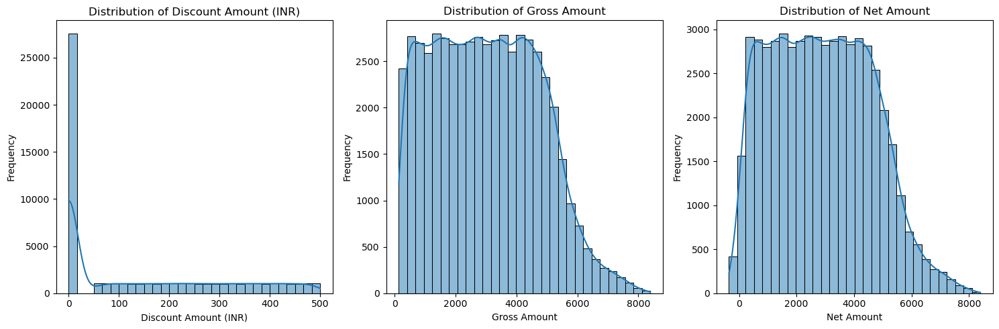

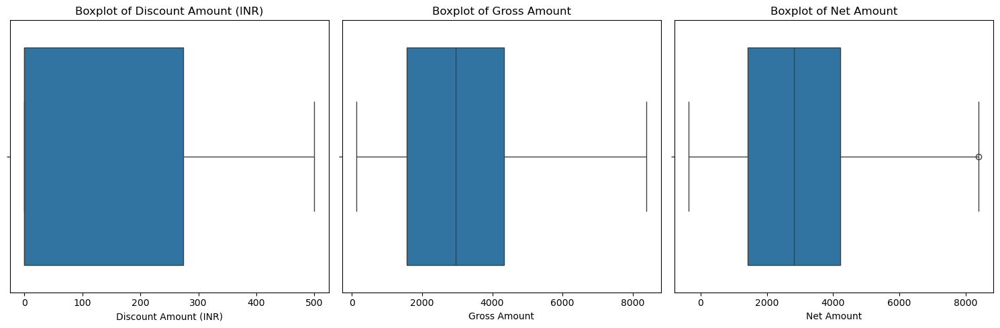

In [1142]:
columns_to_analyze = ['Discount Amount (INR)', 'Gross Amount', 'Net Amount']

for column in columns_to_analyze:
    if column not in df.columns:
        raise ValueError(f"Column '{column}' not found in DataFrame")


plt.figure(figsize=(15, 5))


for i, column in enumerate(columns_to_analyze, start=1):
    plt.subplot(1, 3, i)
    
    # Гистограмма
    sns.histplot(df[column], bins=30, kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# (boxplots) для обнаружения выбросов
plt.figure(figsize=(15, 5))
for i, column in enumerate(columns_to_analyze, start=1):
    plt.subplot(1, 3, i)
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()

По boxplots (ящикам с усами) не наблюдается выбросов

In [1144]:
print(df.shape)

categorical_columns = df.select_dtypes(include=['object', 'category']).columns.tolist()
print(categorical_columns)

numerical_columns = df.select_dtypes(include=['number']).columns.tolist()
print(numerical_columns)
      
data_columns = df.select_dtypes(include=['datetime']).columns.tolist()
print(data_columns)

(55000, 10)
['Gender', 'Age Group', 'Product Category', 'Discount Availed', 'Purchase Method', 'Location']
['Discount Amount (INR)', 'Gross Amount', 'Net Amount']
['Purchase Date']


Вывод по 1.a:
1. Качество данных:
- дубликаты отсуствуют;
- удалены несущественные переменные (CID, TID, Discount Name);
- преобразование столбца в тип даных datetime;
- выбросы отсутствуют;
- отсутствующих значений нет.
2. Актуальность данных:
- c 2019-09-19 11:46:07 до 2024-09-18 16:00:08 - данные взять за 5 последних лет
Данные могут быть использованы для оценки поведения индийских покупателей ecommerce, основываясь на чем, можно будет прогнозировать выручку площадок ecommorce в различные сезоны, улучшать предложения, улучшить работы рекламы и т.д.
3. Достаточность:
- количество строк в каждом столбце составляет 55000.
Число категориальных переменных = 6;
Число количественных переменных = 3;
Число временных переменных = 1.

2. Описание задачи

2.a Задача: какие факторы влияют на итоговую цену (Net Amount) покупки индийских потребителей в ecommerce.

Net Amount - объясняемая переменная;

Объясняющие переменные:
1. Gender;
2. Age Group;
3. Purchase Date;
4. Product Category;
5. Discount Availed;
6. Discount Amount;
7. Gross Amount;
8. Purchase Method;
9. Location.

2.b ML задача: регрессия

3. Исследование данных

3.a Построение релевантных графиков

Изучим объясняющие переменные

1.Gender

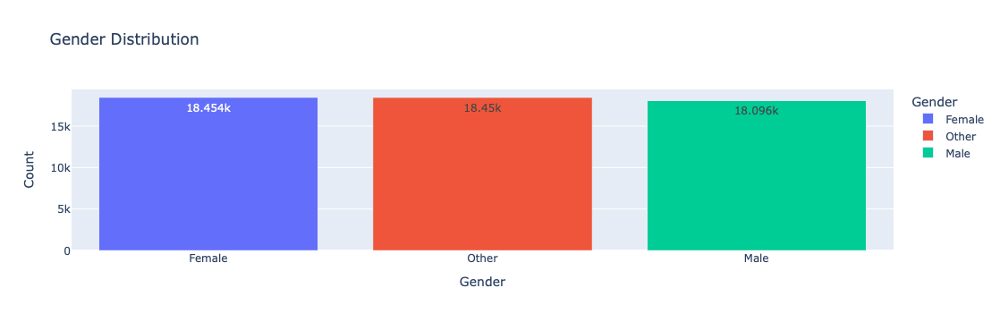

In [1153]:
gender_dist = df['Gender'].value_counts().reset_index()
gender_dist.columns = ['Gender','Count']
fig_gender = px.bar(gender_dist, 
                    x = 'Gender', y = 'Count', 
                    title='Gender Distribution',
                    text_auto = True,
                    color = 'Gender')
fig_gender.show()

Промежуточный вывод: число покупателей женского пола является доминирующем, но так как разница в числе между другими полами небольшая, то можно сказать, что все 3 пола приблизительно в равной степени покупают товары в ecommerce.

2. Age Group

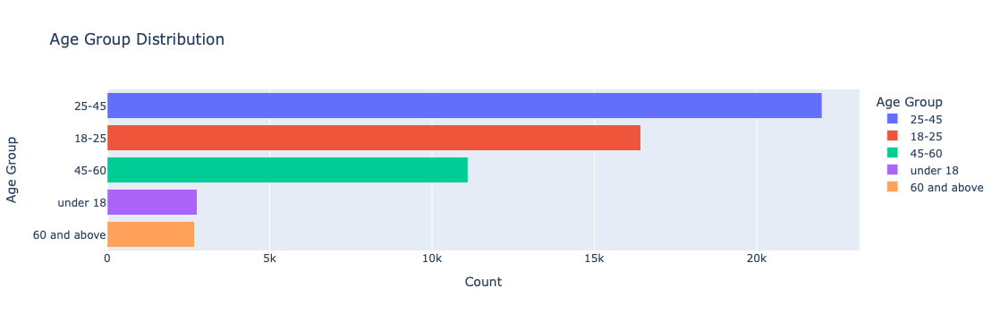

In [1156]:
age_group = df['Age Group'].value_counts().reset_index()
age_group.columns = ['Age Group','Count']
fig = px.bar(age_group, 
                       x = 'Count', y = 'Age Group', 
                       title = 'Age Group Distribution',
                       color = 'Age Group')
fig.show()

3.Purchase Date

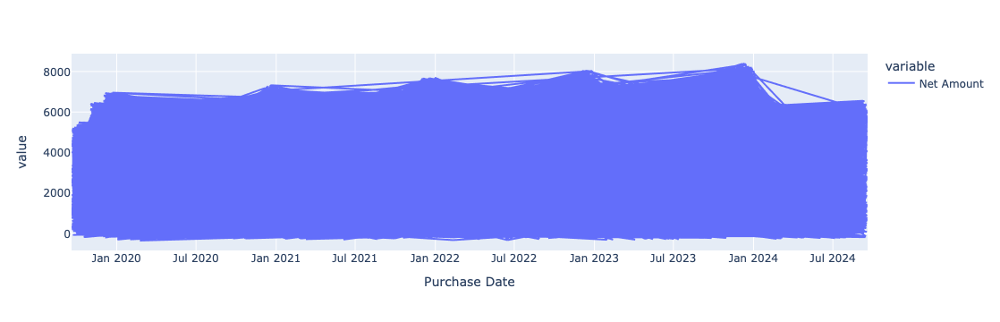

In [1158]:
tnet=df[['Purchase Date','Net Amount']]
tnet=tnet.set_index('Purchase Date')
px.line(data_frame=tnet)

Экстремумы(локальные точки max) итовой суммы покупок в основном приходятся на декабрь текущего года

4. Product Category

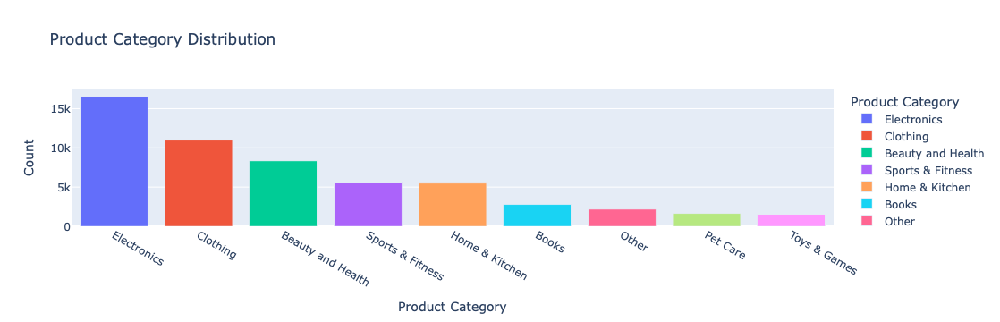

In [1161]:
product_category = df['Product Category'].value_counts().reset_index()
product_category.columns = ['Product Category','Count']
fig_category = px.bar(product_category, 
                      x = 'Product Category', y = 'Count',
                      color = 'Product Category',
                      title = 'Product Category Distribution',
                     ) 
fig_category.show()

Промежуточный вывод: потребители в основном покупают технику, одежду и косметические средства.

5. Discount Amount

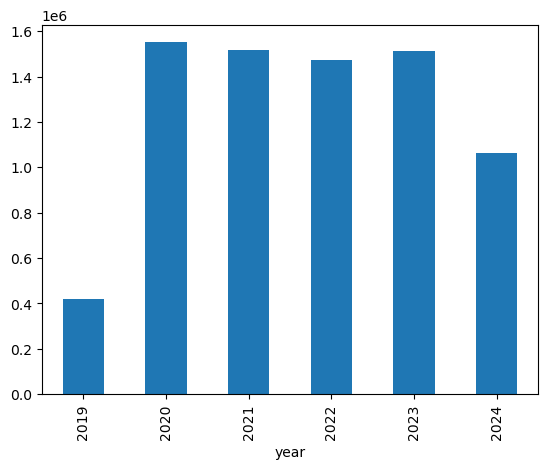

In [1164]:
df['year']=df['Purchase Date'].dt.year
df.groupby('year')['Discount Amount (INR)'].sum().plot(kind='bar')
plt.show()

6. Purchase Method

Промежуточный вывод: наибольшее значение суммы всех пердоставленных скидок приходилось на 2020 год, когда экономика развивалсь активными темпапами.

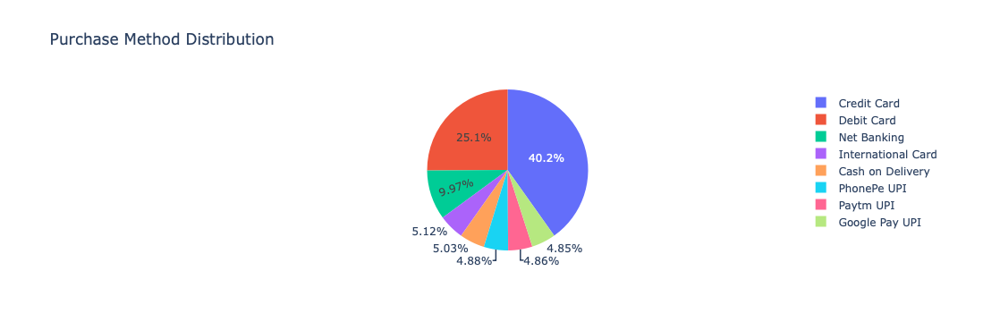

In [1167]:
fig = px.pie(df, names='Purchase Method', 
                             title='Purchase Method Distribution')
fig.show()

Промежуточный вывод: покупатели в основном расплачиваются кредитными и дебетовыми картами. 

7. Location

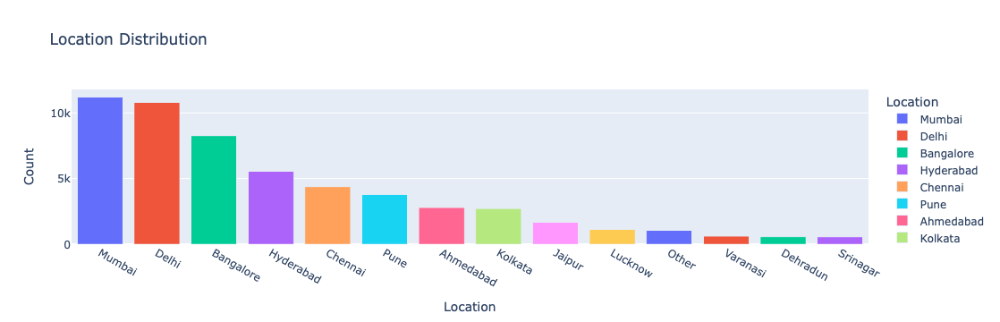

In [1170]:
location_dist = df['Location'].value_counts().reset_index()
location_dist.columns = ['Location','Count']
fig = px.bar(location_dist, 
                      x = 'Location', y = 'Count', 
                      color = 'Location',
                      title='Location Distribution')
fig.show()

Промежуточный вывод: основная доля заказов с ecommerce площадок приходится на города Мумбай и Дели.

8. Gross Amount

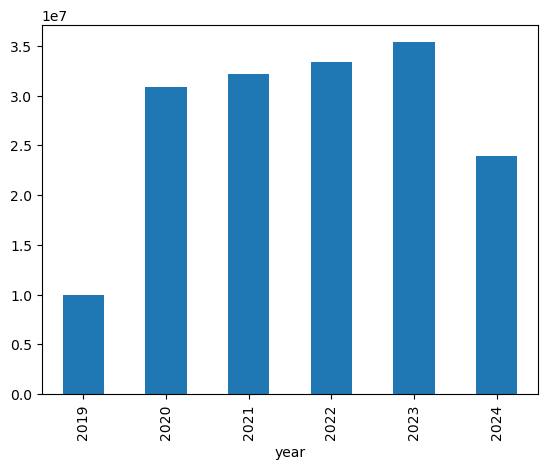

In [1173]:
df['year']=df['Purchase Date'].dt.year
df.groupby('year')['Gross Amount'].sum().plot(kind='bar')
plt.show()

Промежуточный вывод: наибольший размер покупок без применения скидок в денежном выражении приходится на 2023 год

Net Amount - объясняемая переменная

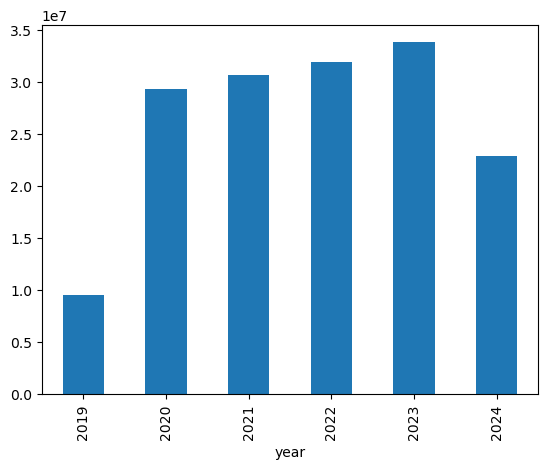

In [1176]:
df['year']=df['Purchase Date'].dt.year
df.groupby('year')['Net Amount'].sum().plot(kind='bar')
plt.show()

Промежуточный вывод: наибольший размер покупок после применения скидок в денежном выражении приходится на 2023 год

Далее будут визуализированы зависимости между объясняемой переменной (Net Amount) и объясняющими переменными

1. Зависимость Net Amount и Purchase Date

Как можно заметить, все пять локальных экстремумах (max) переменной Net Amount наблюдается в Декабре текущего года, что, скорее всего, объясняется новогодними праздниками.

Зависимость Net Amount от Location, Net Amount

In [1182]:
multi1=df[['Purchase Date','Location','Net Amount']]
multi1.head()

,Purchase Date,Location,Net Amount
0,2023-08-30 20:27:08,Ahmedabad,661.004000
1,2024-02-23 09:33:46,Bangalore,4463.801875
2,2022-03-06 09:09:50,Delhi,1774.832575
3,2020-11-04 04:41:57,Delhi,5695.612650
4,2022-05-31 17:00:32,Delhi,1852.731500


In [1183]:
multi1['Purchase Date']=multi1['Purchase Date'].dt.to_period('M')

In [1184]:
multi1.head()

,Purchase Date,Location,Net Amount
0,2023-08,Ahmedabad,661.004000
1,2024-02,Bangalore,4463.801875
2,2022-03,Delhi,1774.832575
3,2020-11,Delhi,5695.612650
4,2022-05,Delhi,1852.731500


In [1185]:
multi1=multi1.groupby(['Purchase Date','Location'],as_index=False)['Net Amount'].sum().sort_values(by='Net Amount',ascending=False)
multi1.head()

,Purchase Date,Location,Net Amount
387,2021-12,Mumbai,789669.9076
718,2023-12,Delhi,783041.6936
723,2023-12,Mumbai,777585.4544
214,2020-12,Delhi,749089.8556
709,2023-11,Mumbai,742488.1756


In [1186]:
multi1['Purchase Date']=multi1['Purchase Date'].astype('datetime64[ns]')

In [1187]:
multi1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 854 entries, 387 to 12
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Purchase Date  854 non-null    datetime64[ns]
 1   Location       854 non-null    object        
 2   Net Amount     854 non-null    float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 26.7+ KB


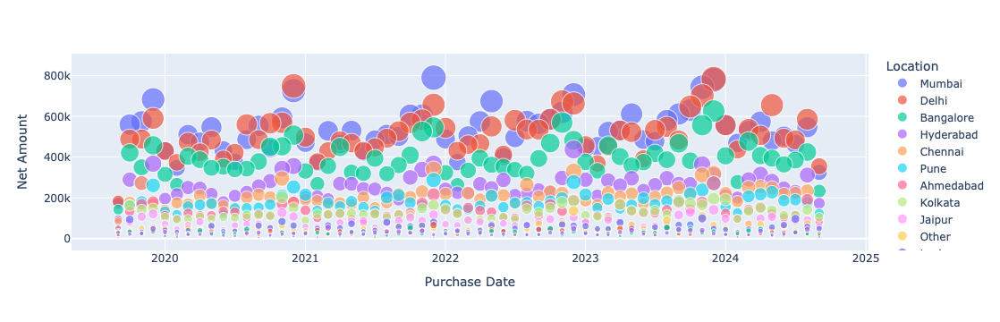

In [1188]:
px.scatter(data_frame=multi1,x=multi1['Purchase Date'],y='Net Amount',color='Location',size='Net Amount')

Промежуточный вывод: самые большие покупки (Net Amount) были сделаны покупателями из Мумбаи и Дели примерно к концу текущего года.

2. Зависимость Net Amount от Age Group

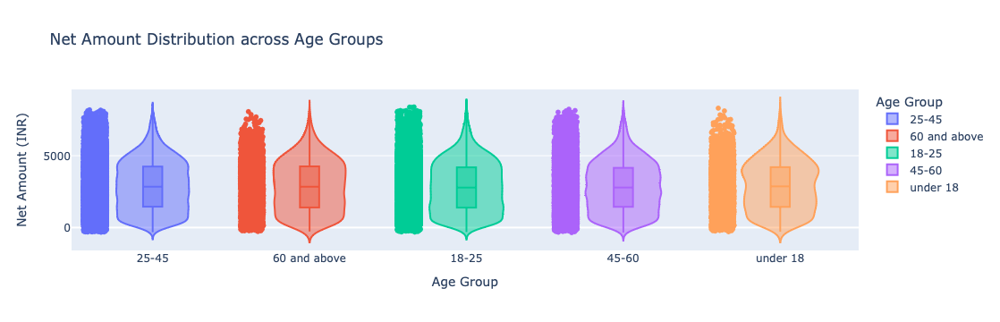

In [1191]:
fig = px.violin(df, 
                          x = 'Age Group', 
                          y = 'Net Amount', 
                          title = 'Net Amount Distribution across Age Groups',
                          color = 'Age Group',
                          box = True,
                          points = 'all',
                          labels = {'Age Group': 'Age Group', 'Net Amount': 'Net Amount (INR)'})
fig.show()

Промежуточный вывод: такие возрастные группы, как 18-25, 25-45, 45-60 делают больше всего покупок.

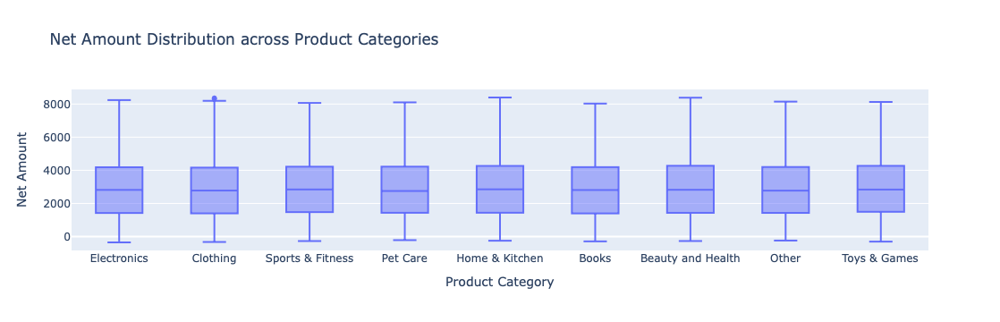

In [1193]:
fig = px.box(df, x = 'Product Category', 
             y = 'Net Amount', 
             title = 'Net Amount Distribution across Product Categories',
             labels={'Product Category': 'Product Category', 'Net Amount': 'Net Amount'},
             )
fig.show()

Промежуточный вывод: максимальные значения по итоговой сумме покупок приходятся на такие категории товаров, как: товары для дома, косметичексие средства, электроника, одежда.

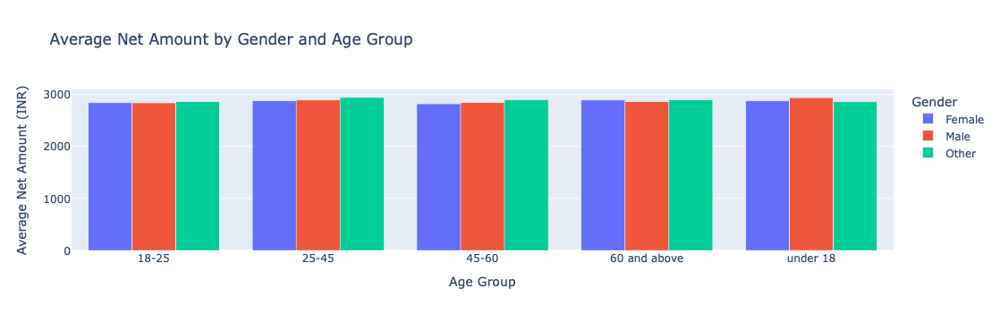

In [1195]:
avg_net_amount = df.groupby(['Gender', 'Age Group'])['Net Amount'].mean().reset_index()
fig_grouped_bar = px.bar(avg_net_amount, 
                          x='Age Group', 
                          y='Net Amount', 
                          color='Gender', 
                          barmode='group', 
                          title='Average Net Amount by Gender and Age Group',
                          labels={'Age Group': 'Age Group', 'Net Amount': 'Average Net Amount (INR)'})
fig_grouped_bar.show()

Промежуточный вывод: в наиболее значимых для ecommerce возрастных группах (18-25,25-45, 45-60)средняя сумма покупки после применения скидки наибольшая у представителей пола "other", на втором месте - "male", на третьем - "женщины".

Зависимость между переменными Purchase Method и Product Category

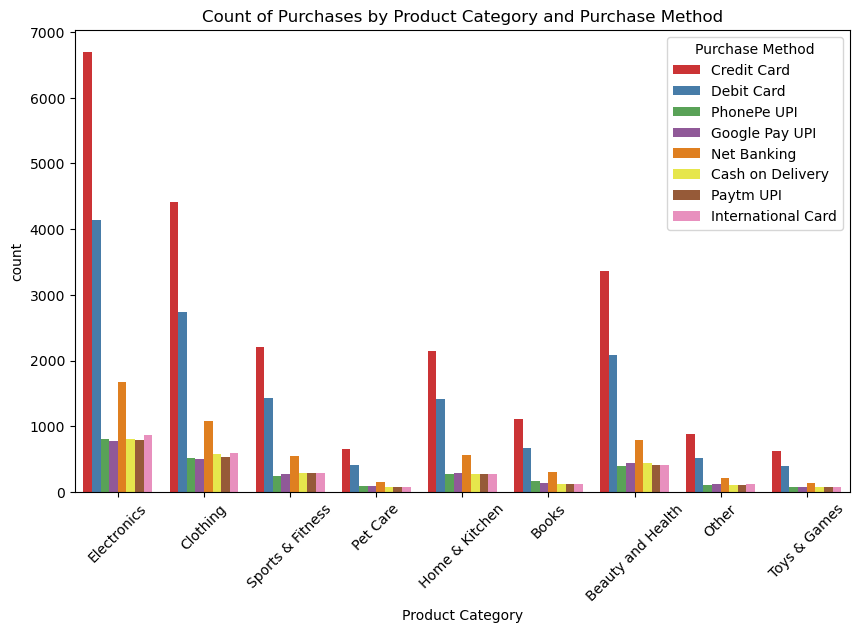

In [1198]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Product Category', hue='Purchase Method', palette='Set1')
plt.title('Count of Purchases by Product Category and Purchase Method')
plt.xticks(rotation=45)
plt.show()

Промежуточный вывод: электронику в основном покупают с использованием кредитной карты, как и все остальные виды продуктов.

Корелляционная матрица между объясняющими переменными:

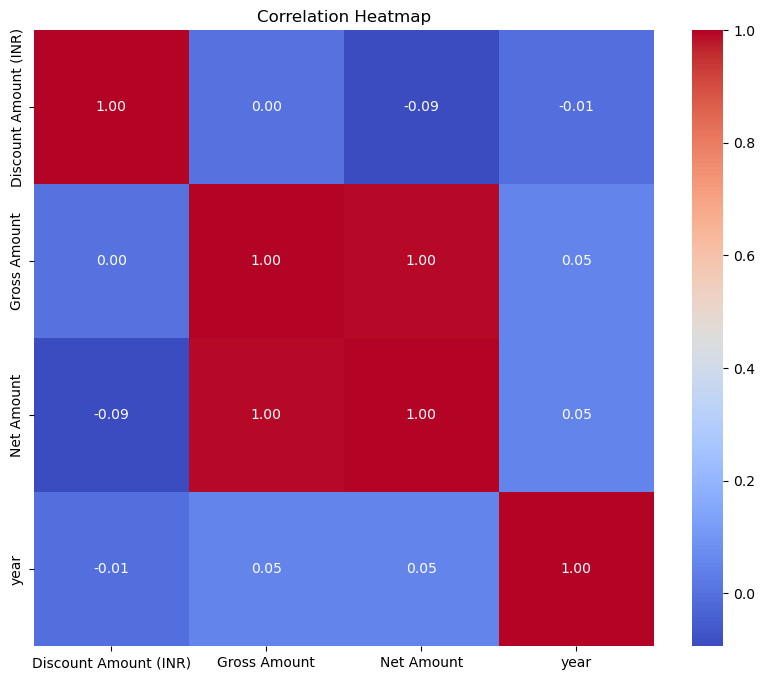

In [1201]:
import numpy as np
numeric_df = df.select_dtypes(include=[np.number])
df['month']=df['Purchase Date'].dt.month
df['day']=df['Purchase Date'].dt.day

plt.figure(figsize=(10, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

Промежуточный вывод:
Наблюдается полная линейная зависимость между Gross Amount  и Net Amount;


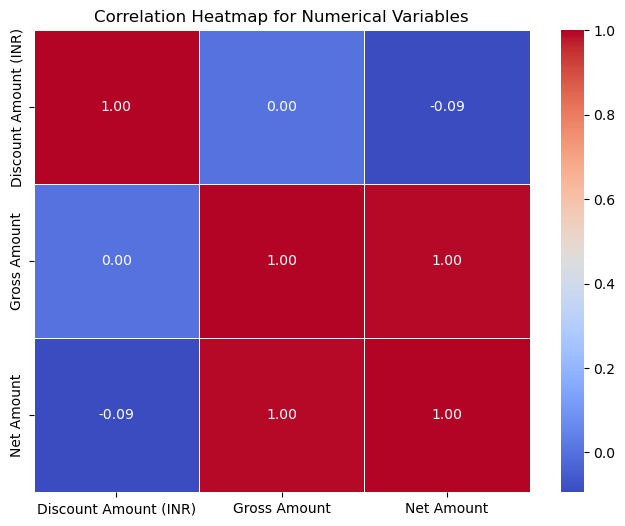

In [1203]:
numerical_columns = ['Discount Amount (INR)', 'Gross Amount', 'Net Amount']
plt.figure(figsize=(8, 6))
correlation_matrix = df[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Heatmap for Numerical Variables')
plt.show()

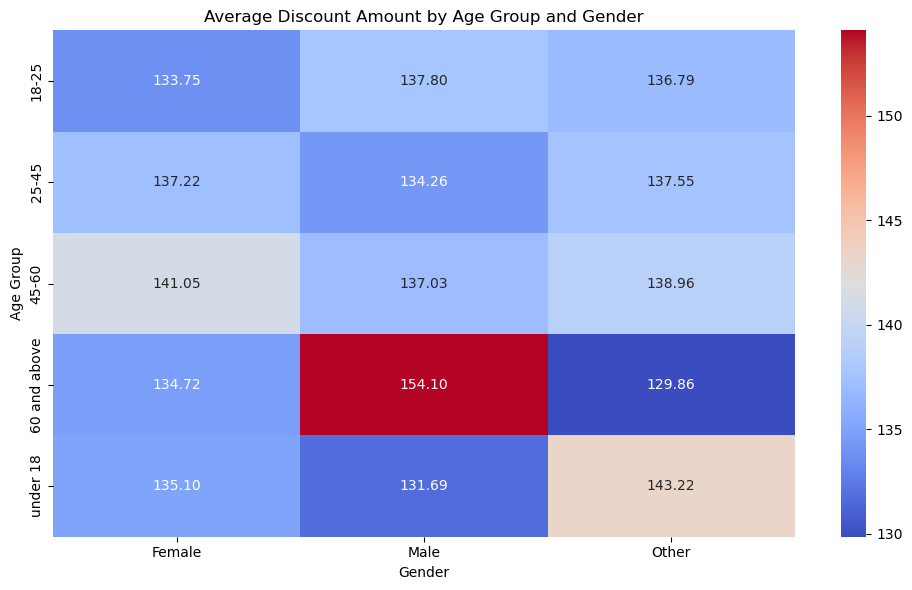

In [1204]:
import pandas as pd

plt.figure(figsize=(10, 6))

discount_by_gender_age = df.pivot_table(index='Age Group', columns='Gender', values='Discount Amount (INR)', aggfunc='mean', fill_value=0)

sns.heatmap(discount_by_gender_age, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Average Discount Amount by Age Group and Gender')

plt.tight_layout()  
plt.show()

Промежуточный вывод: наблюдается сильная связь между полом 'Male' и '60 and above', между 'Female' и '45-60', между 'Other' и 'under 18'

3.b Основные стастики данных

In [1207]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55000 entries, 0 to 54999
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Gender                 55000 non-null  object        
 1   Age Group              55000 non-null  object        
 2   Purchase Date          55000 non-null  datetime64[ns]
 3   Product Category       55000 non-null  object        
 4   Discount Availed       55000 non-null  object        
 5   Discount Amount (INR)  55000 non-null  float64       
 6   Gross Amount           55000 non-null  float64       
 7   Net Amount             55000 non-null  float64       
 8   Purchase Method        55000 non-null  object        
 9   Location               55000 non-null  object        
 10  year                   55000 non-null  int32         
 11  month                  55000 non-null  int32         
 12  day                    55000 non-null  int32         
dtypes

In [1208]:
df.describe()

,Purchase Date,Discount Amount (INR),Gross Amount,Net Amount,year,month,day
count,55000,55000.000000,55000.000000,55000.000000,55000.000000,55000.000000,55000.000000
mean,2022-03-19 14:27:22.813054464,136.986796,3012.936606,2875.949810,2021.713527,6.512764,15.766109
min,2019-09-19 11:46:07,0.000000,136.454325,-351.119775,2019.000000,1.000000,1.000000
25%,2020-12-17 14:39:50,0.000000,1562.111325,1429.551863,2020.000000,4.000000,8.000000
50%,2022-03-17 06:27:07,0.000000,2954.266150,2814.910875,2022.000000,7.000000,16.000000
75%,2023-06-21 10:14:07.500000,274.115000,4342.221675,4211.407838,2023.000000,10.000000,23.000000
max,2024-09-18 16:00:08,500.000000,8394.825600,8394.825600,2024.000000,12.000000,31.000000
std,NaN,165.375502,1718.431066,1726.127778,1.484272,3.447151,8.820393


In [1209]:
df.describe(include = 'all')

,Gender,Age Group,Purchase Date,Product Category,Discount Availed,Discount Amount (INR),Gross Amount,Net Amount,Purchase Method,Location,year,month,day
count,55000,55000,55000,55000,55000,55000.000000,55000.000000,55000.000000,55000,55000,55000.000000,55000.000000,55000.000000
unique,3,5,NaN,9,2,NaN,NaN,NaN,8,14,NaN,NaN,NaN
top,Female,25-45,NaN,Electronics,No,NaN,NaN,NaN,Credit Card,Mumbai,NaN,NaN,NaN
freq,18454,22010,NaN,16574,27585,NaN,NaN,NaN,22096,11197,NaN,NaN,NaN
mean,NaN,NaN,2022-03-19 14:27:22.813054464,NaN,NaN,136.986796,3012.936606,2875.949810,NaN,NaN,2021.713527,6.512764,15.766109
min,NaN,NaN,2019-09-19 11:46:07,NaN,NaN,0.000000,136.454325,-351.119775,NaN,NaN,2019.000000,1.000000,1.000000
25%,NaN,NaN,2020-12-17 14:39:50,NaN,NaN,0.000000,1562.111325,1429.551863,NaN,NaN,2020.000000,4.000000,8.000000
50%,NaN,NaN,2022-03-17 06:27:07,NaN,NaN,0.000000,2954.266150,2814.910875,NaN,NaN,2022.000000,7.000000,16.000000
75%,NaN,NaN,2023-06-21 10:14:07.500000,NaN,NaN,274.115000,4342.221675,4211.407838,NaN,NaN,2023.000000,10.000000,23.000000
max,NaN,NaN,2024-09-18 16:00:08,NaN,NaN,500.000000,8394.825600,8394.825600,NaN,NaN,2024.000000,12.000000,31.000000


3.с Работа с категориальными данными. Создание dummy переменных.

In [1211]:
obj_df = df.select_dtypes(include=['object']).copy()
obj_df.head()

,Gender,Age Group,Product Category,Discount Availed,Purchase Method,Location
0,Female,25-45,Electronics,Yes,Credit Card,Ahmedabad
1,Male,25-45,Electronics,Yes,Credit Card,Bangalore
2,Other,60 and above,Clothing,Yes,Credit Card,Delhi
3,Other,60 and above,Sports & Fitness,No,Debit Card,Delhi
4,Male,18-25,Sports & Fitness,Yes,Credit Card,Delhi


In [1212]:
df.isnull().sum()

Gender                   0
Age Group                0
Purchase Date            0
Product Category         0
Discount Availed         0
Discount Amount (INR)    0
Gross Amount             0
Net Amount               0
Purchase Method          0
Location                 0
year                     0
month                    0
day                      0
dtype: int64

In [1272]:
columns_excluded = ['Purchase Date', 'Net Amount']

In [1274]:
X = df.drop(columns_excluded, axis = 1)

In [1276]:
X

,Gender,Age Group,Product Category,Discount Availed,Discount Amount (INR),Gross Amount,Purchase Method,Location,year,month,day
0,Female,25-45,Electronics,Yes,64.30,725.304000,Credit Card,Ahmedabad,2023,8,30
1,Male,25-45,Electronics,Yes,175.19,4638.991875,Credit Card,Bangalore,2024,2,23
2,Other,60 and above,Clothing,Yes,211.54,1986.372575,Credit Card,Delhi,2022,3,6
3,Other,60 and above,Sports & Fitness,No,0.00,5695.612650,Debit Card,Delhi,2020,11,4
4,Male,18-25,Sports & Fitness,Yes,439.92,2292.651500,Credit Card,Delhi,2022,5,31
...,...,...,...,...,...,...,...,...,...,...,...
54995,Other,25-45,Electronics,Yes,110.89,2819.907300,Debit Card,Other,2020,2,23
54996,Other,18-25,Electronics,Yes,488.59,3891.303900,Cash on Delivery,Bangalore,2021,7,12
54997,Male,45-60,Home & Kitchen,Yes,417.63,4094.687500,Credit Card,Mumbai,2024,8,2
54998,Female,45-60,Beauty and Health,Yes,204.56,3977.473500,Credit Card,Kolkata,2020,8,5


In [1278]:
Y = df['Net Amount']

In [1280]:
Y

0         661.004000
1        4463.801875
2        1774.832575
3        5695.612650
4        1852.731500
            ...     
54995    2709.017300
54996    3402.713900
54997    3677.057500
54998    3772.913500
54999    3322.771900
Name: Net Amount, Length: 55000, dtype: float64

In [1282]:
X_encoded = pd.get_dummies(X)

In [1284]:
X_encoded

,Discount Amount (INR),Gross Amount,year,month,day,Gender_Female,Gender_Male,Gender_Other,Age Group_18-25,Age Group_25-45,...,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kolkata,Location_Lucknow,Location_Mumbai,Location_Other,Location_Pune,Location_Srinagar,Location_Varanasi
0,64.30,725.304000,2023,8,30,True,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1,175.19,4638.991875,2024,2,23,False,True,False,False,True,...,False,False,False,False,False,False,False,False,False,False
2,211.54,1986.372575,2022,3,6,False,False,True,False,False,...,True,False,False,False,False,False,False,False,False,False
3,0.00,5695.612650,2020,11,4,False,False,True,False,False,...,True,False,False,False,False,False,False,False,False,False
4,439.92,2292.651500,2022,5,31,False,True,False,True,False,...,True,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54995,110.89,2819.907300,2020,2,23,False,False,True,False,True,...,False,False,False,False,False,False,True,False,False,False
54996,488.59,3891.303900,2021,7,12,False,False,True,True,False,...,False,False,False,False,False,False,False,False,False,False
54997,417.63,4094.687500,2024,8,2,False,True,False,False,False,...,False,False,False,False,False,True,False,False,False,False
54998,204.56,3977.473500,2020,8,5,True,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False


In [1286]:
X_encoded = X_encoded.replace([True, False], [1,0])

In [1288]:
X_encoded

,Discount Amount (INR),Gross Amount,year,month,day,Gender_Female,Gender_Male,Gender_Other,Age Group_18-25,Age Group_25-45,...,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kolkata,Location_Lucknow,Location_Mumbai,Location_Other,Location_Pune,Location_Srinagar,Location_Varanasi
0,64.30,725.304000,2023,8,30,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,175.19,4638.991875,2024,2,23,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,211.54,1986.372575,2022,3,6,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
3,0.00,5695.612650,2020,11,4,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
4,439.92,2292.651500,2022,5,31,0,1,0,1,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54995,110.89,2819.907300,2020,2,23,0,0,1,0,1,...,0,0,0,0,0,0,1,0,0,0
54996,488.59,3891.303900,2021,7,12,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
54997,417.63,4094.687500,2024,8,2,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
54998,204.56,3977.473500,2020,8,5,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [1290]:
X_final_1 = X_encoded.drop(['Gender_Other', 'Age Group_18-25','Product Category_Beauty and Health', 'Location_Delhi', 'Discount Availed_No', 'Purchase Method_Credit Card'], axis = 'columns')
X_final_1

,Discount Amount (INR),Gross Amount,year,month,day,Gender_Female,Gender_Male,Age Group_25-45,Age Group_45-60,Age Group_60 and above,...,Location_Dehradun,Location_Hyderabad,Location_Jaipur,Location_Kolkata,Location_Lucknow,Location_Mumbai,Location_Other,Location_Pune,Location_Srinagar,Location_Varanasi
0,64.30,725.304000,2023,8,30,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,175.19,4638.991875,2024,2,23,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,211.54,1986.372575,2022,3,6,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0.00,5695.612650,2020,11,4,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,439.92,2292.651500,2022,5,31,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54995,110.89,2819.907300,2020,2,23,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
54996,488.59,3891.303900,2021,7,12,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
54997,417.63,4094.687500,2024,8,2,0,1,0,1,0,...,0,0,0,0,0,1,0,0,0,0
54998,204.56,3977.473500,2020,8,5,1,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0


In [1292]:
X_final_1.head(10)

,Discount Amount (INR),Gross Amount,year,month,day,Gender_Female,Gender_Male,Age Group_25-45,Age Group_45-60,Age Group_60 and above,...,Location_Dehradun,Location_Hyderabad,Location_Jaipur,Location_Kolkata,Location_Lucknow,Location_Mumbai,Location_Other,Location_Pune,Location_Srinagar,Location_Varanasi
0,64.30,725.304000,2023,8,30,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,175.19,4638.991875,2024,2,23,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,211.54,1986.372575,2022,3,6,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0.00,5695.612650,2020,11,4,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,439.92,2292.651500,2022,5,31,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,127.01,3649.397400,2021,7,12,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0.00,5593.935600,2023,10,8,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0.00,1901.796400,2022,12,14,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0.00,3961.671000,2020,4,29,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,437.50,1497.350400,2023,12,18,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


3.c
Выводы по структуре данных:
- имеется временной ряд зависимой переменной Net Amount от 38 переменных, включая dummy переменные;
- число покупателей женского пола является доминирующем, но так как разница в числе между другими полами небольшая, то можно сказать, что все 3 пола приблизительно в равной степени покупают товары в ecommerce.
- видно, что Net Amount и Gross Amount имеют положительную корреляционную связь, равную 1;
- такие возрастные группы, как 18-25, 25-45, 45-60 делают больше всего покупок (Net Amount);
- максимальные значения по итоговой сумме покупок приходятся на такие категории товаров, как: товары для дома, косметичексие средства, электроника, одежда;
- электронику в основном покупают с использованием кредитной карты, как и все остальные виды продуктов.
- экстремумы(локальные точки max) итовой суммы покупок в основном приходятся на декабрь текущего года;
- cамые большие покупки (Net Amount) были сделаны покупателями из Мумбаи и Дели примерно к концу текущего года;
- наибольшее значение суммы всех пердоставленных скидок приходилось на 2020 год;
- наибольший размер покупок после применения скидок в денежном выражении приходится на 2023 год;
- наибольший размер покупок без применения скидок в денежном выражении приходится на 2023 год.


Так, чем крупнее город, откуда был оформлен заказа, тем больше итоговая сумма заказа. 
Чем ближе к концу текущего кода, тем больше сумма заказа. Если заказчик находится в трудоспособном возрасте, то вероятность заказа на большую сумму больше всего. Чем больше Gross Amount, тем больше Net Amount. Заказчик с кредитной картой с большей вероятностью разместить заказ на большую сумму. Наличие скидки, пол покупателя лишь в незначительной степени влияет на Net Amount. 


Задание №3

3.1

a) Пропуски отсутствуют. Это было выяснено при выполнении первого задания.

б) Выбросы отсутствуют. Это было выяснено при выполении первого задания.

Построение линеной модели регрессии

In [1300]:
from sklearn.datasets import load_diabetes
from sklearn.linear_model import LinearRegression
from sklearn.dummy import DummyRegressor

Разделим данные на 2 группы: тренировочные(75%) и тестовые (25%)

In [1330]:
X_final_1_train, X_final_1_test, Y_train, Y_test = train_test_split(X_final_1, Y, random_state=2023, test_size=0.25)
X_final_1_train.head()

,Discount Amount (INR),Gross Amount,year,month,day,Gender_Female,Gender_Male,Age Group_25-45,Age Group_45-60,Age Group_60 and above,...,Location_Dehradun,Location_Hyderabad,Location_Jaipur,Location_Kolkata,Location_Lucknow,Location_Mumbai,Location_Other,Location_Pune,Location_Srinagar,Location_Varanasi
50354,103.49,1211.33250,2020,8,18,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
36491,385.49,4818.81600,2023,5,31,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
54967,165.25,1655.28700,2022,4,27,1,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
22921,0.00,2120.48550,2020,4,20,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
34741,0.00,3732.01565,2022,10,16,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [1332]:
Y_train.head()

50354    1107.84250
36491    4433.32600
54967    1490.03700
22921    2120.48550
34741    3732.01565
Name: Net Amount, dtype: float64

In [1334]:
dummy = DummyRegressor(strategy='median')
dummy.fit(X_final_1_train, Y_train)
y_preds_dummy = dummy.predict(X_final_1_test)

Применяеме median, чтобы оценить, насколько модель превосходит простое предсказание медианного значения на тренировочном наборе данных.

In [1337]:
y_preds_dummy

array([2815.126925, 2815.126925, 2815.126925, ..., 2815.126925,
       2815.126925, 2815.126925])

In [1339]:
lr = LinearRegression()
lr.fit(X_final_1_train, Y_train)
y_preds_lr = lr.predict(X_final_1_test)

In [1341]:
y_preds_lr

array([1125.1825  ,   62.228775, 4167.8125  , ..., 2531.298   ,
       4691.543   , 4453.84    ])

1. Метрика MAE

In [1363]:
from sklearn.metrics import mean_absolute_error

In [1365]:
print(f'MAE for Dummy Regressor: {mean_absolute_error(y_test, y_preds_dummy)}')
print(f'MAE for Linear regression: {mean_absolute_error(y_test, y_preds_lr)}')

MAE for Dummy Regressor: 1466.1845499781816
MAE for Linear regression: 7.029516115863999e-11


MAE считает абсолютную ошибку модели. Таким образом, модель в абсолютном выражении ошибается на 7.029516115863999e-11 по сравнению с фактическими значениями, что является хорошим результатом. Недостатком данного метода являются тот факт, что выводятся средние абсолютные значения ошибок модели, что порой сложно интерпретировать.

Т.е. MAE показывает, что модель линейно построена верно. MSE принимает значения от 0 до ∞.

2. MAPE

In [1350]:
from sklearn.metrics import mean_absolute_percentage_error

In [1368]:
print(f'MAPE for Dummy Regressor: {mean_absolute_percentage_error(y_test, y_preds_dummy)}')
print(f'MAPE for Linear regression: {mean_absolute_percentage_error(y_test, y_preds_lr)}')

MAPE for Dummy Regressor: 4.241542870037447
MAPE for Linear regression: 1.841211070580515e-13


MAPE в отличие от MAE показывает относительную ошибку модели, которая составляет 1.841211070580515e-13.

2. Коэффициент деретминации R^2. Коэффициент детерминации показывает, какая доля дисперсии таргетов (знаменатель) объяснена моделью. У идеальных предсказаний равен 1, у лучшего константного предсказания он равен  0 на обучающей выборке.

In [1370]:
from sklearn.metrics import r2_score

In [1356]:
print(f'R2 score for Dummy Regressor: {r2_score(y_test, y_preds_dummy)}')
print(f'R2 score for Linear regression: {r2_score(y_test, y_preds_lr)}')

R2 score for Dummy Regressor: -0.0015832371401751644
R2 score for Linear regression: 1.0


Вывод: так как R^2 = 1, то объясняющие переменные на 100% объясняют изменение значений объясняемой переменной Net Amount. 
Причина выбора R^2: коэффициент дереминации показывает, насколько хорошо построена модель, как хорошо все выбранные объясняющие переменные описывают изменение объясняемой перменной. Не был выбран R^2 adjusted, так как не планируется добавлять новые переменные, соотвественно, в условиях данной задачи достаточно R^2.

3. MSE

MSE используют, если большие ошибки недопустимы и должны сильно влиять на модель.

In [1373]:
from sklearn.metrics import mean_squared_error
import seaborn as sns
import pandas as pd

In [1375]:
print(f'MSE for Dummy Regressor: {mean_squared_error(y_test, y_preds_dummy)}')
print(f'MSE for Linear regression: {mean_squared_error(y_test, y_preds_lr)}')

MSE for Dummy Regressor: 3014336.701742475
MSE for Linear regression: 6.657241114885547e-21


Значение MSE стремится к нулю, что говорит о том, что ошибки ничтожно малы.

4.RMSE (квадратный корень из MSE)

In [1377]:
print(f'RMSE for Dummy Regressor: {mean_squared_error(y_test, y_preds_dummy, squared=False)}')
print(f'RMSE for Linear regression: {mean_squared_error(y_test, y_preds_lr, squared=False)}')

RMSE for Dummy Regressor: 1736.1845241052217
RMSE for Linear regression: 8.159191819589455e-11


Значение RMSE стремится к нулю, что говорит о том, что ошибки ничтожно малы.

ВЫВОДЫ по заданию №2:

1. a) Пропуски отсутствуют. Это было выяснено при выполнении первого задания.

   б) Выбросы отсутствуют. Это было выяснено при выполении первого задания.
3. Метрики:
- MAE и MAPE

MAE было выбрано для того, чтобы получить абсолютное отклонение предсказанного значения от фактического. Значение MAE стремится к нулю (1.841211070580515e-13), что свидетельствует о небольших ошибках модели. Но из-за того, что значения абсолютные, то их сложно интерперетировать. Тогда обращаемся к MAPE.

MAPE было выбрано для того, чтобы получить относительное отклонение предсказанного значения от своего фактического. Значение MAPE,стремится к нулю (1.841211070580515e-13), что свидетельствует о небольших ошибках модели.

- MSE и RMSE

MSE было выбрано для того, что получить квадрат отклонения предсканного значения от своего фактического, т.е. квадрат ошибки. Значение MSE ,стремится к нулю (6.657241114885547e-21), что свидетельствует о небольших ошибках модели.

RMSE было выбрано для того, чтобы поулучить корень из MSE и оценить отклонение предсказанного значения от своего фактического. Значение RMSE,стремится к нулю (8.159191819589455e-11), что свидетельствует о небольших ошибках модели.

- R^2 - лучшая и самая подходящая метрика, так как коэффициент детерминации показывает, какая доля дисперсии таргета объяснена моделью. У идеальных предсказаний равен 1, что в результате и получилось. Стоит отметить, что нет необходимости в подсчете R^2 adjusted, так как не планируется добавлять новые переменные в модель.

Таким  образом, модель построена верно, так как она объясняет 100% изменение объясняемой переменной Net Amount.

3. Категориальные данные были перекодированы выше в первом задании перед разбиением данных на 2 группы (тренировачные данные и тестовые данные) с помощью pd.get_dummies, т.е. с помощью One-hot encoding, который создает dummy переменные. Так как для данного датасета порядок и ранжирование неважны, то можно использовать One-hot encoding, с помощью которого категориальные данные преобразуются в числа: 0(если значения в данном наблюдении нет) и 1(если значения в данном наблюдении есть). Так как данный способ перекодировки может привезти к мультиколлинеарности, то была удалена одна dummy переменная в каждом признаке, т.е. было введено на 1 dummy меньше, чем количество уникальных значений для категориальной переменной.